In [18]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np



def overlay(image, mask, color, alpha, resize=None):
    """Combines image and its segmentation mask into a single image.
    
    Params:
        image: Training image. np.ndarray,
        mask: Segmentation mask. np.ndarray,
        color: Color for segmentation mask rendering.  tuple[int, int, int] = (255, 0, 0)
        alpha: Segmentation mask's transparency. float = 0.5,
        resize: If provided, both image and its mask are resized before blending them together.
        tuple[int, int] = (1024, 1024))

    Returns:
        image_combined: The combined image. np.ndarray

    """
    # color = color[::-1]
    colored_mask = np.expand_dims(mask, 0).repeat(3, axis=0)
    colored_mask = np.moveaxis(colored_mask, 0, -1)
    masked = np.ma.MaskedArray(image, mask=colored_mask, fill_value=color)
    image_overlay = masked.filled()

    if resize is not None:
        image = cv2.resize(image.transpose(1, 2, 0), resize)
        image_overlay = cv2.resize(image_overlay.transpose(1, 2, 0), resize)

    image_combined = cv2.addWeighted(image, 1 - alpha, image_overlay, alpha, 0)

    return image_combined
            

def plot_one_box(x, img, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image img
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)



# Load a model
model = YOLO("/work/home/jae/trash_detection/results/train11/weights/best.pt")
class_names = model.names
print('Class Names: ', class_names)
# colors = [[random.randint(0, 255) for _ in range(3)] for _ in class_names]
colors = [[255, 0, 0], [0, 255, 0]]
# cap = cv2.VideoCapture('test.mp4')
# cap = cv2.VideoCapture(2)

img_paths = [
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110494.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110495.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110500.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110501.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110502.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110507.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110508.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110509.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110516.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110518.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110527.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110575.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110579.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110640.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110648.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110650.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110657.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110673.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110747.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110748.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110799.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110821.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110829.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110832.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110837.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110848.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110854.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110860.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110872.JPG",
    "/data1/trash_detection_livinglab/001_1-17/01_주간/G0110874.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0616 일산/01_주간/G-0617-03593.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0616 일산/01_주간/G-0617-03619.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_1 화성/01_주간/G-0627_1-00249.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_1 화성/01_주간/G-0627_1-00252.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-01978.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-00038.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-00042.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-00285.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-00605.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-01792.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-02002.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-02050.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-01555.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0627_2 동탄/01_주간/G-0627_2-01430.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-00161.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-00205.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-02127.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-02373.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-02568.JPG",
    "/data1/trash_detection_Pyeongtaek_Ilsan/0628 평택/01_주간/G-0628-02636.JPG"

]

imgs = []
for img_path in img_paths:
    img = cv2.imread(img_path)
    print(img_path)
    print()
    
    h, w, _ = img.shape
    results = model.predict(img, stream=True)
    # print(results)
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs
    
    if masks is not None:
        masks = masks.data.cpu()
        for seg, box in zip(masks.data.cpu().numpy(), boxes):
    
            seg = cv2.resize(seg, (w, h))
            img = overlay(img, seg, colors[int(box.cls)], 0.4)
            
            xmin = int(box.data[0][0])
            ymin = int(box.data[0][1])
            xmax = int(box.data[0][2])
            ymax = int(box.data[0][3])
            
            # plot_one_box([xmin, ymin, xmax, ymax], img, colors[int(box.cls)], f'{class_names[int(box.cls)]} {float(box.conf):.3}')
    
    # cv2.imshow('img', img)
    # if cv2.waitKey(1) & 0xFF == ord('q'):
        # break

    imgs.append(img)

Class Names:  {0: 'TargetArea', 1: 'LineArea'}
/data1/trash_detection_livinglab/001_1-17/01_주간/G0110494.JPG


0: 576x640 1 TargetArea, 8.6ms
Speed: 5.1ms preprocess, 8.6ms inference, 2.4ms postprocess per image at shape (1, 3, 576, 640)
/data1/trash_detection_livinglab/001_1-17/01_주간/G0110495.JPG


0: 576x640 1 TargetArea, 1 LineArea, 8.4ms
Speed: 4.3ms preprocess, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 576, 640)
/data1/trash_detection_livinglab/001_1-17/01_주간/G0110500.JPG


0: 576x640 1 TargetArea, 1 LineArea, 6.2ms
Speed: 3.2ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 640)
/data1/trash_detection_livinglab/001_1-17/01_주간/G0110501.JPG


0: 576x640 (no detections), 5.2ms
Speed: 2.7ms preprocess, 5.2ms inference, 0.4ms postprocess per image at shape (1, 3, 576, 640)
/data1/trash_detection_livinglab/001_1-17/01_주간/G0110502.JPG


0: 576x640 1 TargetArea, 1 LineArea, 5.1ms
Speed: 2.7ms preprocess, 5.1ms inference, 1.4ms postprocess 

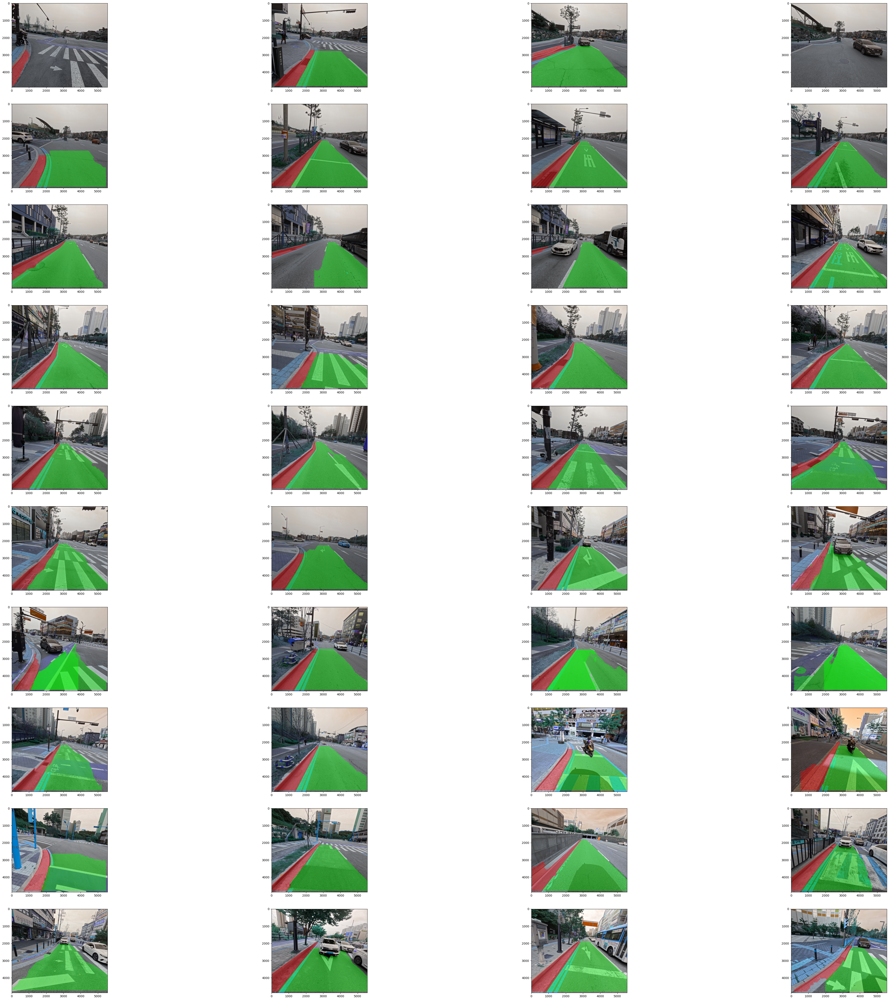

In [22]:
_, axs = plt.subplots(10, 4, figsize=(60, 60))
axs = axs.flatten()
for img, ax in zip(imgs, axs):
    ax.imshow(img)
plt.show()